# Linear Regression

Problem Statement

In [93]:
pip install pandas_profiling

Note: you may need to restart the kernel to use updated packages.


## ProBlem Statement 

"""A bike-sharing system is a service in which bikes are made available for shared use to individuals on a short term basis for a price or free. Many bike share systems allow people to borrow a bike from a "dock" which is usually computer-controlled wherein the user enters the payment information, and the system unlocks it. This bike can then be returned to another dock belonging to the same system.


A US bike-sharing provider BoomBikes has recently suffered considerable dips in their revenues due to the ongoing Corona pandemic. The company is finding it very difficult to sustain in the current market scenario. So, it has decided to come up with a mindful business plan to be able to accelerate its revenue as soon as the ongoing lockdown comes to an end, and the economy restores to a healthy state. 


In such an attempt, BoomBikes aspires to understand the demand for shared bikes among the people after this ongoing quarantine situation ends across the nation due to Covid-19. They have planned this to prepare themselves to cater to the people's needs once the situation gets better all around and stand out from other service providers and make huge profits.


They have contracted a consulting company to understand the factors on which the demand for these shared bikes depends. Specifically, they want to understand the factors affecting the demand for these shared bikes in the American market. The company wants to know:

Which variables are significant in predicting the demand for shared bikes.
How well those variables describe the bike demands
Based on various meteorological surveys and people's styles, the service provider firm has gathered a large dataset on daily bike demands across the American market based on some factors. 

"""


Column description

Dataset characteristics
=========================================	
day.csv have the following fields:
	
	- instant: record index
	- dteday : date
	- season : season (1:spring, 2:summer, 3:fall, 4:winter)
	- yr : year (0: 2018, 1:2019)
	- mnth : month ( 1 to 12)
	- holiday : weather day is a holiday or not (extracted from http://dchr.dc.gov/page/holiday-schedule)
	- weekday : day of the week
	- workingday : if day is neither weekend nor holiday is 1, otherwise is 0.
	+ weathersit : 
		- 1: Clear, Few clouds, Partly cloudy, Partly cloudy
		- 2: Mist + Cloudy, Mist + Broken clouds, Mist + Few clouds, Mist
		- 3: Light Snow, Light Rain + Thunderstorm + Scattered clouds, Light Rain + Scattered clouds
		- 4: Heavy Rain + Ice Pallets + Thunderstorm + Mist, Snow + Fog
	- temp : temperature in Celsius
	- atemp: feeling temperature in Celsius
	- hum: humidity
	- windspeed: wind speed
	- casual: count of casual users
	- registered: count of registered users
	- cnt: count of total rental bikes including both casual and registered

In [2]:
# import libraries

import pandas as pd
import numpy as np
import pickle

# import visual libraries
from pandas_profiling import ProfileReport
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

# import warnings
import warnings
warnings.filterwarnings('ignore')

# import machine learning modles
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import r2_score
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LassoCV,Lasso,RidgeCV,Ridge,ElasticNetCV,ElasticNet
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.feature_selection import RFE


Import Dataset

In [4]:
bike = pd.read_csv('day.csv')
bike.head()

,instant,dteday,season,yr,mnth,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
0,1,01-01-2018,1,0,1,0,1,1,2,14.110847,18.18125,80.5833,10.749882,331,654,985
1,2,02-01-2018,1,0,1,0,2,1,2,14.902598,17.68695,69.6087,16.652113,131,670,801
2,3,03-01-2018,1,0,1,0,3,1,1,8.050924,9.47025,43.7273,16.636703,120,1229,1349
3,4,04-01-2018,1,0,1,0,4,1,1,8.200000,10.60610,59.0435,10.739832,108,1454,1562
4,5,05-01-2018,1,0,1,0,5,1,1,9.305237,11.46350,43.6957,12.522300,82,1518,1600


## In Data Analysis we will analyze to find below steps

1. Missing values
2. Al the numerical varisables
3. Distribution of the numerical variables 
4. categorical variables
5. outliers
6. the relationship between the independent and dependent variables
7. correlation

In [5]:
bike.shape

(730, 16)

In [6]:
ProfileReport(bike)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Observation - 
1. By pandas profiling we got to know that there are feature columns are corellated to each other 
2. Missing values are zero 



In [7]:
bike.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 730 entries, 0 to 729
Data columns (total 16 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   instant     730 non-null    int64  
 1   dteday      730 non-null    object 
 2   season      730 non-null    int64  
 3   yr          730 non-null    int64  
 4   mnth        730 non-null    int64  
 5   holiday     730 non-null    int64  
 6   weekday     730 non-null    int64  
 7   workingday  730 non-null    int64  
 8   weathersit  730 non-null    int64  
 9   temp        730 non-null    float64
 10  atemp       730 non-null    float64
 11  hum         730 non-null    float64
 12  windspeed   730 non-null    float64
 13  casual      730 non-null    int64  
 14  registered  730 non-null    int64  
 15  cnt         730 non-null    int64  
dtypes: float64(4), int64(11), object(1)
memory usage: 91.4+ KB


In [8]:
bike.describe()

,instant,season,yr,mnth,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
count,730.000000,730.000000,730.000000,730.000000,730.000000,730.000000,730.000000,730.000000,730.000000,730.000000,730.000000,730.000000,730.000000,730.000000,730.000000
mean,365.500000,2.498630,0.500000,6.526027,0.028767,2.995890,0.690411,1.394521,20.319259,23.726322,62.765175,12.763620,849.249315,3658.757534,4508.006849
std,210.877136,1.110184,0.500343,3.450215,0.167266,2.000339,0.462641,0.544807,7.506729,8.150308,14.237589,5.195841,686.479875,1559.758728,1936.011647
min,1.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,2.424346,3.953480,0.000000,1.500244,2.000000,20.000000,22.000000
25%,183.250000,2.000000,0.000000,4.000000,0.000000,1.000000,0.000000,1.000000,13.811885,16.889713,52.000000,9.041650,316.250000,2502.250000,3169.750000
50%,365.500000,3.000000,0.500000,7.000000,0.000000,3.000000,1.000000,1.000000,20.465826,24.368225,62.625000,12.125325,717.000000,3664.500000,4548.500000
75%,547.750000,3.000000,1.000000,10.000000,0.000000,5.000000,1.000000,2.000000,26.880615,30.445775,72.989575,15.625589,1096.500000,4783.250000,5966.000000
max,730.000000,4.000000,1.000000,12.000000,1.000000,6.000000,1.000000,3.000000,35.328347,42.044800,97.250000,34.000021,3410.000000,6946.000000,8714.000000


In [9]:
bike.describe(include='O') ## To check with categorical columns

,dteday
count,730
unique,730
top,01-01-2018
freq,1


In [10]:
bike.isnull().sum()

instant       0
dteday        0
season        0
yr            0
mnth          0
holiday       0
weekday       0
workingday    0
weathersit    0
temp          0
atemp         0
hum           0
windspeed     0
casual        0
registered    0
cnt           0
dtype: int64

Observation - 
1. Great there is no null value


Drop Columns

In [11]:
bike.drop('instant',axis=1,inplace= True)
bike.drop('dteday',axis=1, inplace = True)
bike.drop('casual',axis=1, inplace= True)
bike.drop('registered',axis=1, inplace= True)

In [12]:
bike

,season,yr,mnth,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,cnt
0,1,0,1,0,1,1,2,14.110847,18.18125,80.5833,10.749882,985
1,1,0,1,0,2,1,2,14.902598,17.68695,69.6087,16.652113,801
2,1,0,1,0,3,1,1,8.050924,9.47025,43.7273,16.636703,1349
3,1,0,1,0,4,1,1,8.200000,10.60610,59.0435,10.739832,1562
4,1,0,1,0,5,1,1,9.305237,11.46350,43.6957,12.522300,1600
...,...,...,...,...,...,...,...,...,...,...,...,...
725,1,1,12,0,5,1,2,10.420847,11.33210,65.2917,23.458911,2114
726,1,1,12,0,6,0,2,10.386653,12.75230,59.0000,10.416557,3095
727,1,1,12,0,0,0,2,10.386653,12.12000,75.2917,8.333661,1341
728,1,1,12,0,1,1,1,10.489153,11.58500,48.3333,23.500518,1796


<AxesSubplot:>

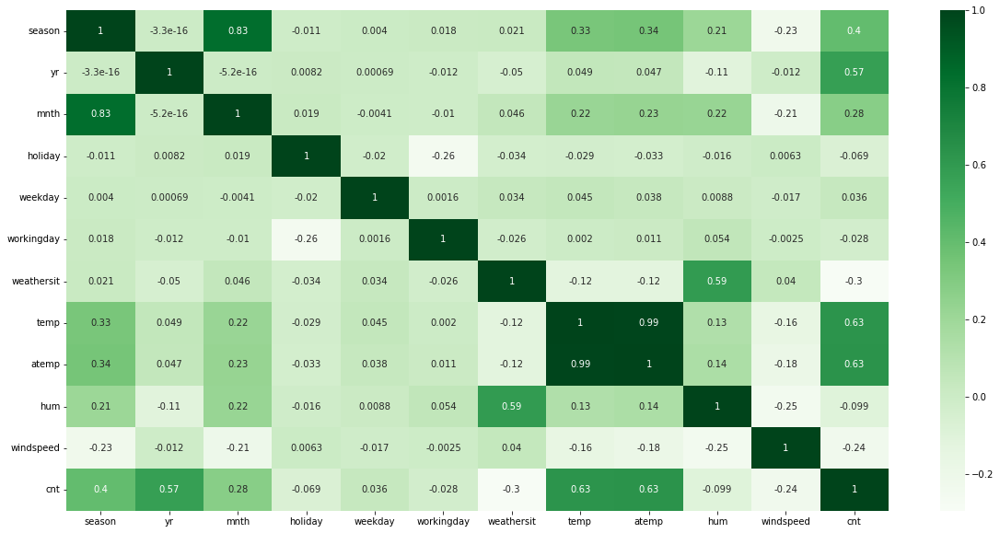

In [13]:
## Lets find correlation before drop any other columns 
## correlation with our target variable which is cnt
plt.figure(figsize=(20,10))
sns.heatmap(bike.corr(), annot=True, cmap='Greens')

#### Change binary variable into categorical for analysis

season ,	yr ,	mnth,   	holiday,	weekday	,workingday	,weathersit

In [14]:
# season : season (1:spring, 2:summer, 3:fall, 4:winter)
seasons = {1:'spring',2:'summer',3:'fall',4:'winter'}
bike['season'] = bike['season'].map(seasons)
bike

,season,yr,mnth,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,cnt
0,spring,0,1,0,1,1,2,14.110847,18.18125,80.5833,10.749882,985
1,spring,0,1,0,2,1,2,14.902598,17.68695,69.6087,16.652113,801
2,spring,0,1,0,3,1,1,8.050924,9.47025,43.7273,16.636703,1349
3,spring,0,1,0,4,1,1,8.200000,10.60610,59.0435,10.739832,1562
4,spring,0,1,0,5,1,1,9.305237,11.46350,43.6957,12.522300,1600
...,...,...,...,...,...,...,...,...,...,...,...,...
725,spring,1,12,0,5,1,2,10.420847,11.33210,65.2917,23.458911,2114
726,spring,1,12,0,6,0,2,10.386653,12.75230,59.0000,10.416557,3095
727,spring,1,12,0,0,0,2,10.386653,12.12000,75.2917,8.333661,1341
728,spring,1,12,0,1,1,1,10.489153,11.58500,48.3333,23.500518,1796


In [15]:
## working day

bike['workingday'] = bike['workingday'].map({0:'Holiday',1:'Working'})


In [16]:
## drop holiday columns

bike.drop('holiday', axis=1 , inplace = True)

#### We need to label the values as in weekday -  
- days are no need to be ranked 

#### weathersit 

+ weathersit : 
- 1: Clear, Few clouds, Partly cloudy, Partly cloudy
- 2: Mist + Cloudy, Mist + Broken clouds, Mist + Few clouds, Mist
- 3: Light Snow, Light Rain + Thunderstorm + Scattered clouds, Light Rain + Scattered clouds
- 4: Heavy Rain + Ice Pallets + Thunderstorm + Mist, Snow + Fog

In [17]:
# weathersit
ws = {1:'Clear',2:'Mist',3:'Light Snow',4:'Heavy Rain'}
bike['weathersit'] = bike['weathersit'].map(ws)

In [18]:
# weekdays
weedays = {0:'Mon',1:'Tue',2:'Wed',3:'Thu',4:'Fri',5:'Sat',6:'Sun'}
bike['weekday'] = bike['weekday'].map(weedays)

In [19]:
# year
bike['yr'] = bike['yr'].map({0:2018,1:2019})

In [20]:
bike

,season,yr,mnth,weekday,workingday,weathersit,temp,atemp,hum,windspeed,cnt
0,spring,2018,1,Tue,Working,Mist,14.110847,18.18125,80.5833,10.749882,985
1,spring,2018,1,Wed,Working,Mist,14.902598,17.68695,69.6087,16.652113,801
2,spring,2018,1,Thu,Working,Clear,8.050924,9.47025,43.7273,16.636703,1349
3,spring,2018,1,Fri,Working,Clear,8.200000,10.60610,59.0435,10.739832,1562
4,spring,2018,1,Sat,Working,Clear,9.305237,11.46350,43.6957,12.522300,1600
...,...,...,...,...,...,...,...,...,...,...,...
725,spring,2019,12,Sat,Working,Mist,10.420847,11.33210,65.2917,23.458911,2114
726,spring,2019,12,Sun,Holiday,Mist,10.386653,12.75230,59.0000,10.416557,3095
727,spring,2019,12,Mon,Holiday,Mist,10.386653,12.12000,75.2917,8.333661,1341
728,spring,2019,12,Tue,Working,Clear,10.489153,11.58500,48.3333,23.500518,1796


In [21]:
# Month

month = {1:'Jan' , 2:'Feb' , 3:'Mar',4:'April',5:'May',6:'June',7:'July',8:'Aug',9:'Sep',10:'Oct',11:'Nov',12:'Dec'}
bike['mnth'] = bike['mnth'].map(month)

In [22]:
bike

,season,yr,mnth,weekday,workingday,weathersit,temp,atemp,hum,windspeed,cnt
0,spring,2018,Jan,Tue,Working,Mist,14.110847,18.18125,80.5833,10.749882,985
1,spring,2018,Jan,Wed,Working,Mist,14.902598,17.68695,69.6087,16.652113,801
2,spring,2018,Jan,Thu,Working,Clear,8.050924,9.47025,43.7273,16.636703,1349
3,spring,2018,Jan,Fri,Working,Clear,8.200000,10.60610,59.0435,10.739832,1562
4,spring,2018,Jan,Sat,Working,Clear,9.305237,11.46350,43.6957,12.522300,1600
...,...,...,...,...,...,...,...,...,...,...,...
725,spring,2019,Dec,Sat,Working,Mist,10.420847,11.33210,65.2917,23.458911,2114
726,spring,2019,Dec,Sun,Holiday,Mist,10.386653,12.75230,59.0000,10.416557,3095
727,spring,2019,Dec,Mon,Holiday,Mist,10.386653,12.12000,75.2917,8.333661,1341
728,spring,2019,Dec,Tue,Working,Clear,10.489153,11.58500,48.3333,23.500518,1796


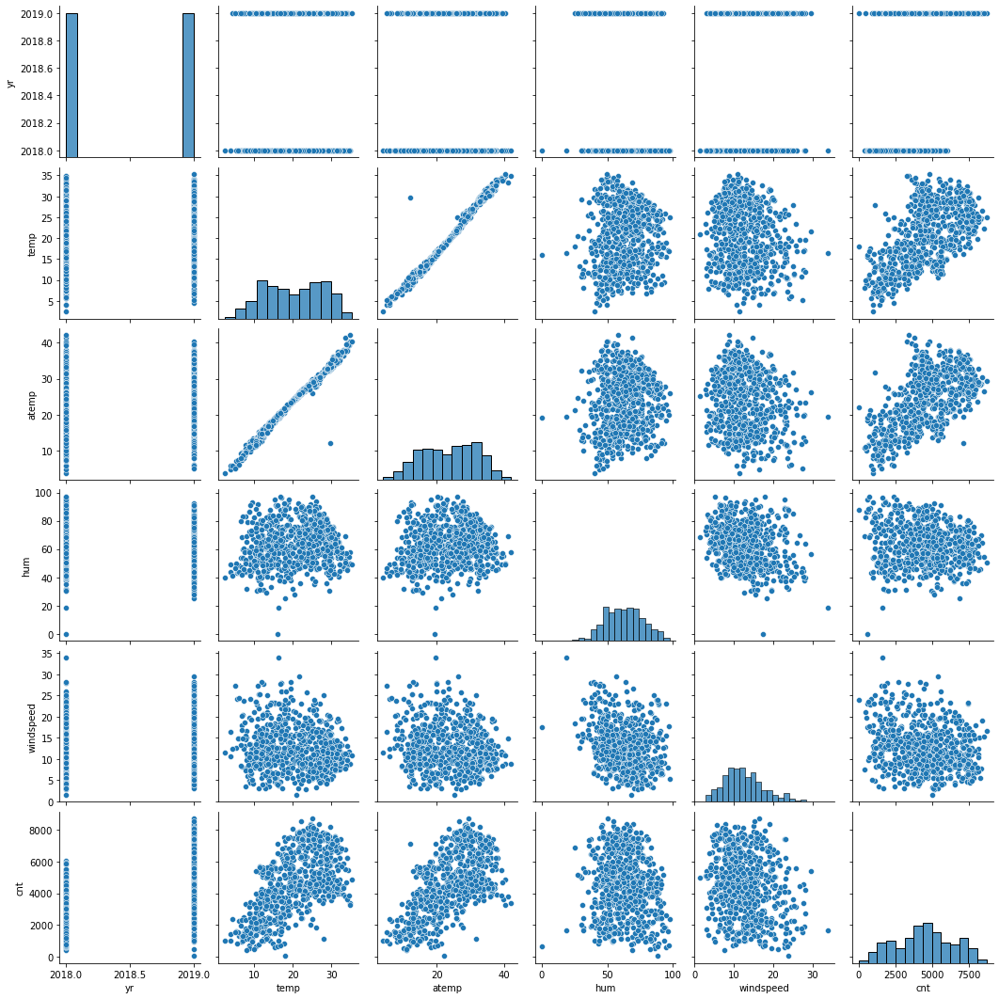

In [23]:
## Relation plot with cnt column

sns.pairplot(bike)

### Observation
1. atemp and temp are co related to each other



<AxesSubplot:xlabel='workingday', ylabel='cnt'>

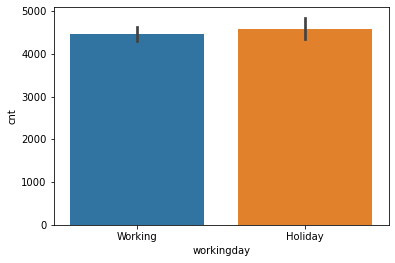

In [24]:
sns.barplot(data = bike , x = 'workingday', y = 'cnt')

Not much difference


In [25]:
cat_var =  [x for x in bike.columns if bike[x].dtype == 'O']
cat_var

['season', 'mnth', 'weekday', 'workingday', 'weathersit']

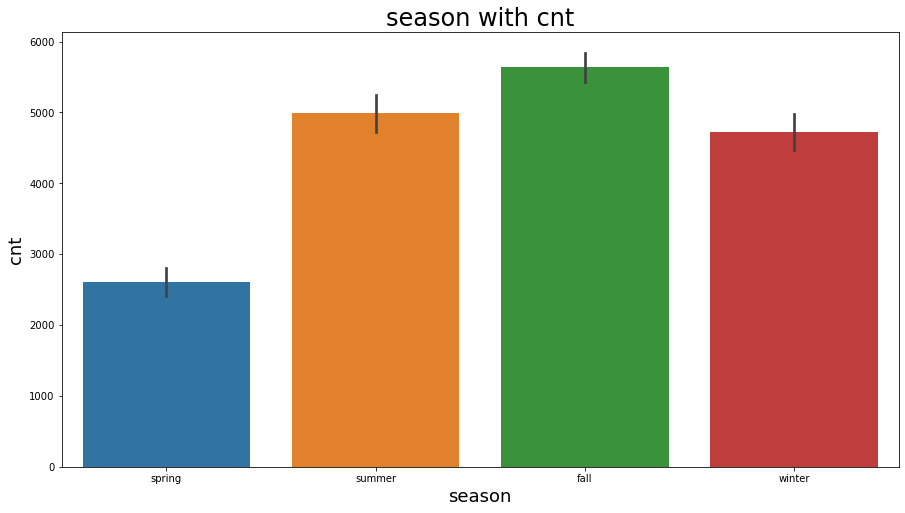

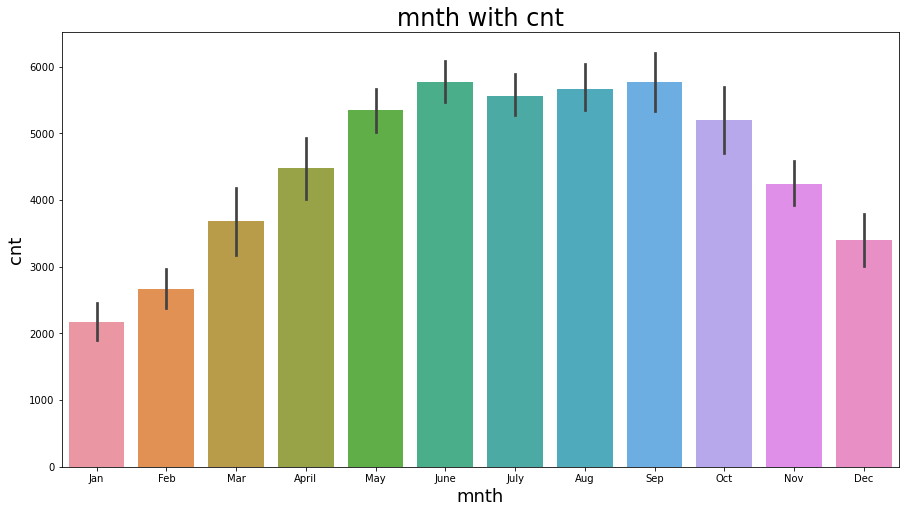

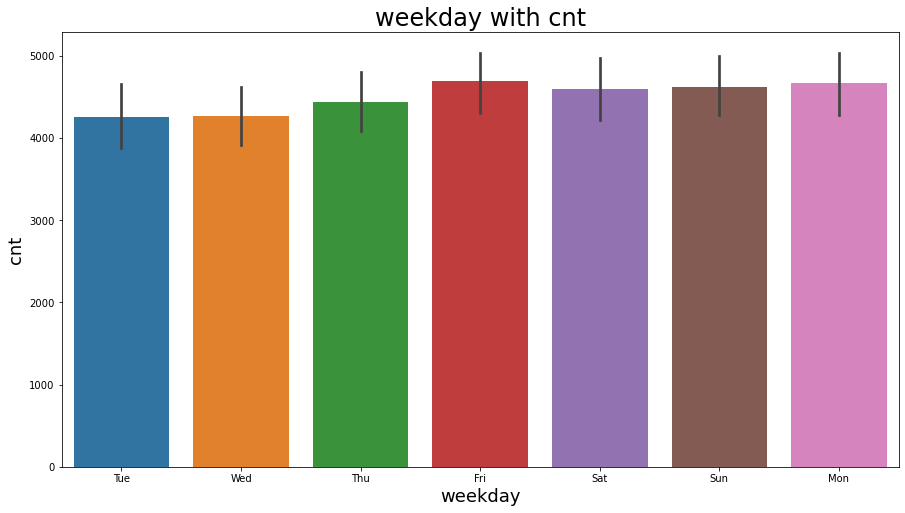

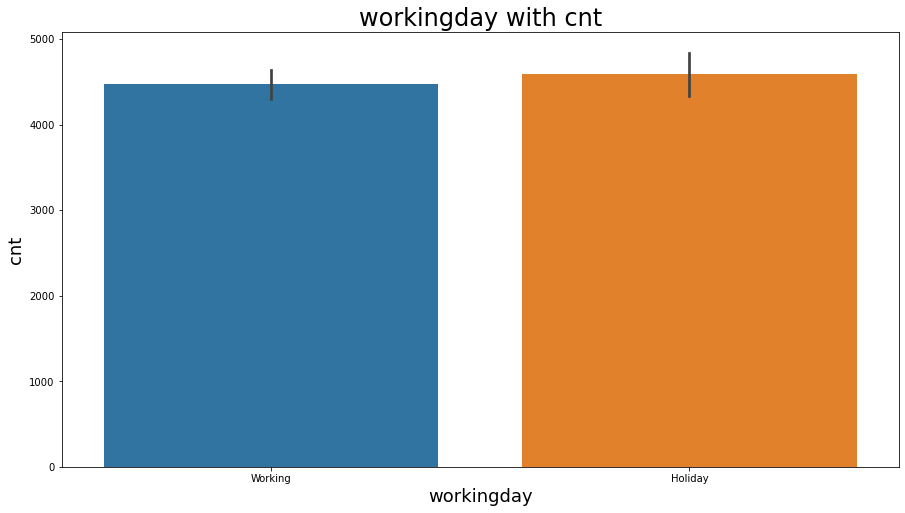

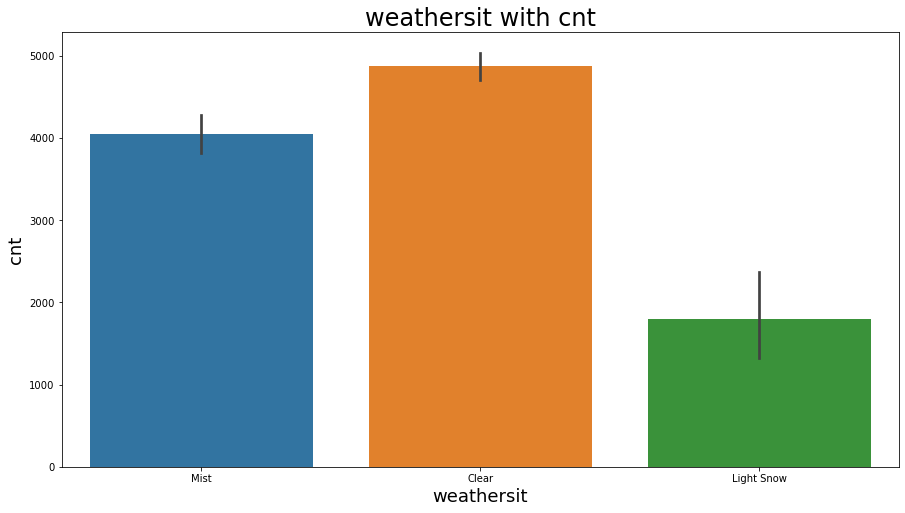

In [26]:
for i,j in enumerate(cat_var):
     plt.figure(figsize=(15,8))
     sns.barplot(data = bike , x = j , y = 'cnt')
     plt.title ( '{} with cnt'.format(j), fontsize =  24)
     plt.xlabel(j, fontsize = 18)
     plt.ylabel('cnt', fontsize = 18)
     plt.show()

#### Observation -

1. season fall is high
2. weatersit clear is high


<AxesSubplot:xlabel='yr', ylabel='cnt'>

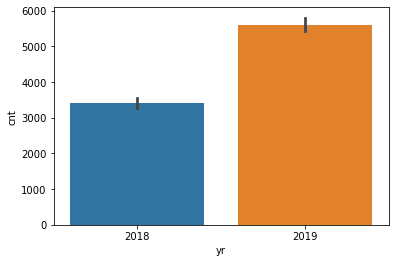

In [27]:
sns.barplot(data= bike , x= 'yr', y='cnt')

In [28]:
numerical_var = [x for x in bike.columns if bike[x].dtype == 'float' or bike[x].dtype == 'int']
numerical_var

['yr', 'temp', 'atemp', 'hum', 'windspeed', 'cnt']

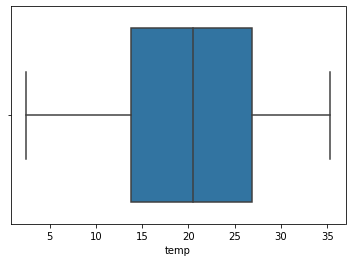

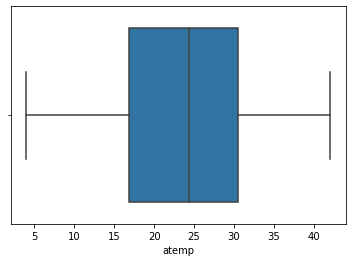

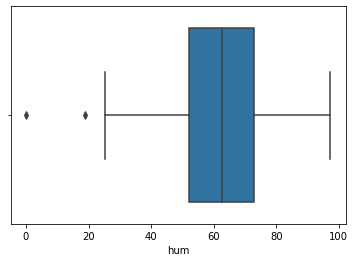

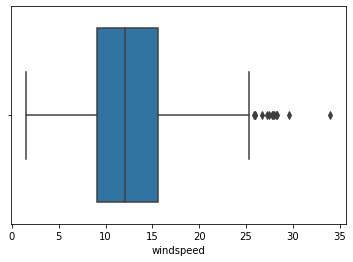

In [29]:
## to check ouliers
num = ['temp', 'atemp', 'hum', 'windspeed']
for i in num:
    sns.boxplot(bike[i])
    plt.show()


#### Observation

1. windspeed have some outliers
2. hum is also have some outliers

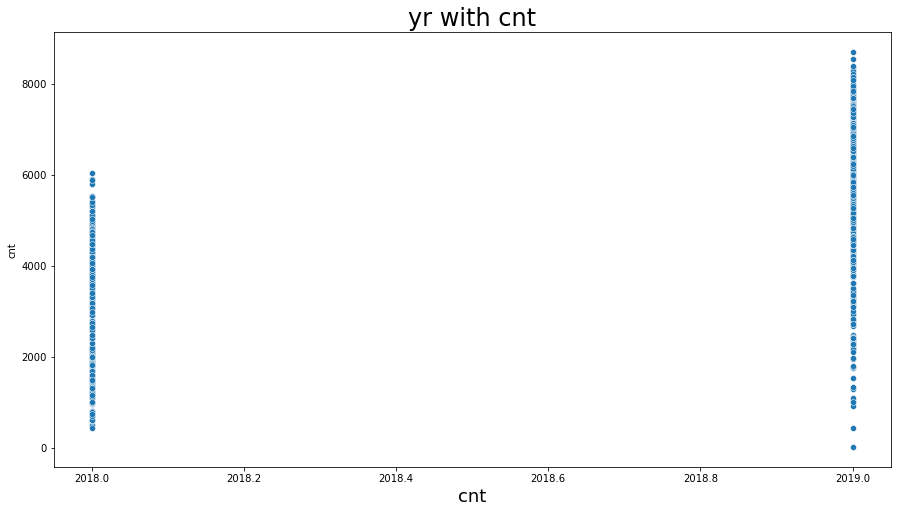

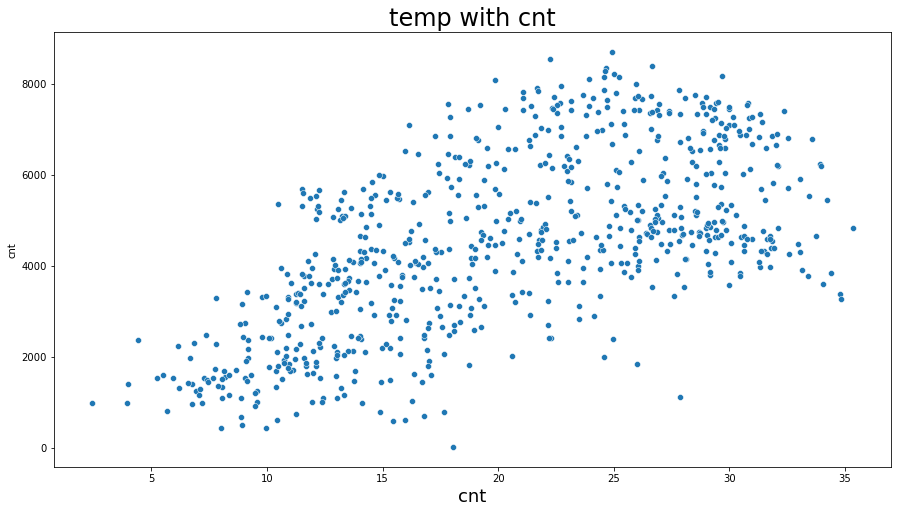

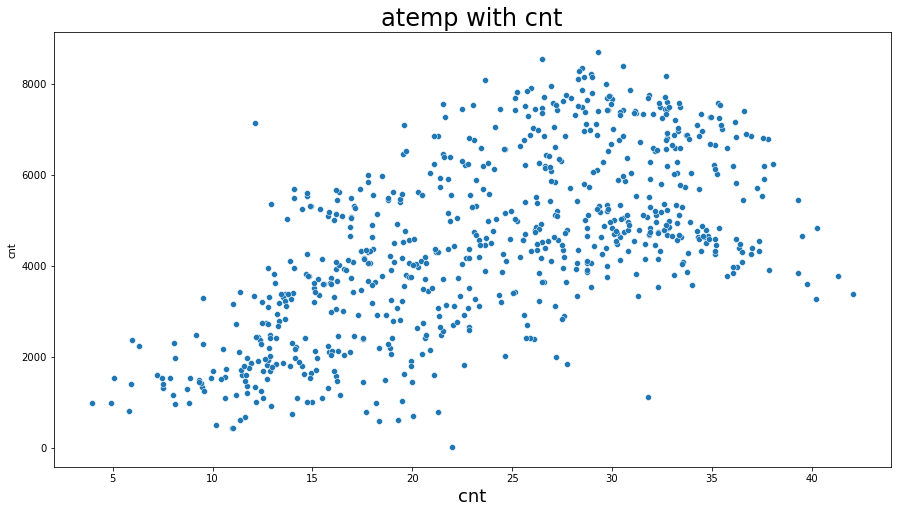

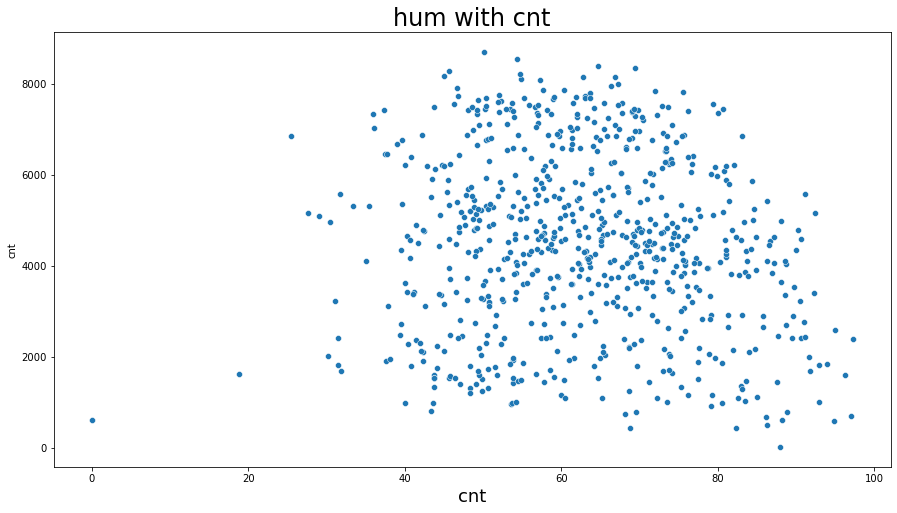

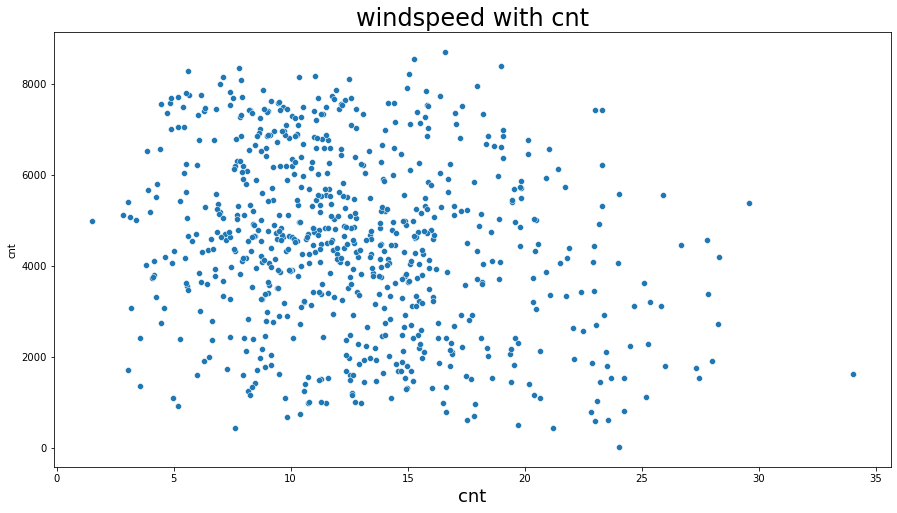

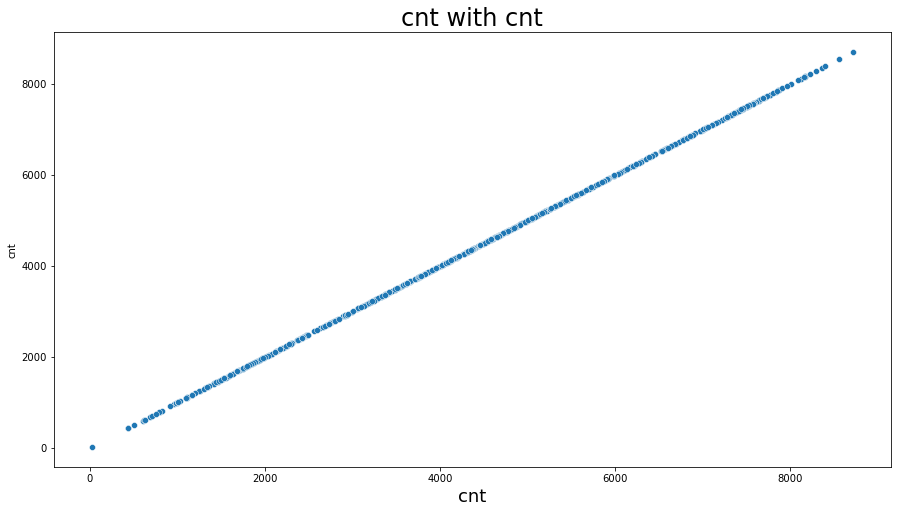

In [30]:
## Scatterplot

for i,j in enumerate(numerical_var):
     plt.figure(figsize=(15,8))
     sns.scatterplot(data = bike , x = j , y = 'cnt')
     plt.title ( '{} with cnt'.format(j), fontsize =  24)
     plt.xlabel(j, fontsize = 18)
     plt.xlabel('cnt', fontsize = 18)
     plt.show()

<AxesSubplot:>

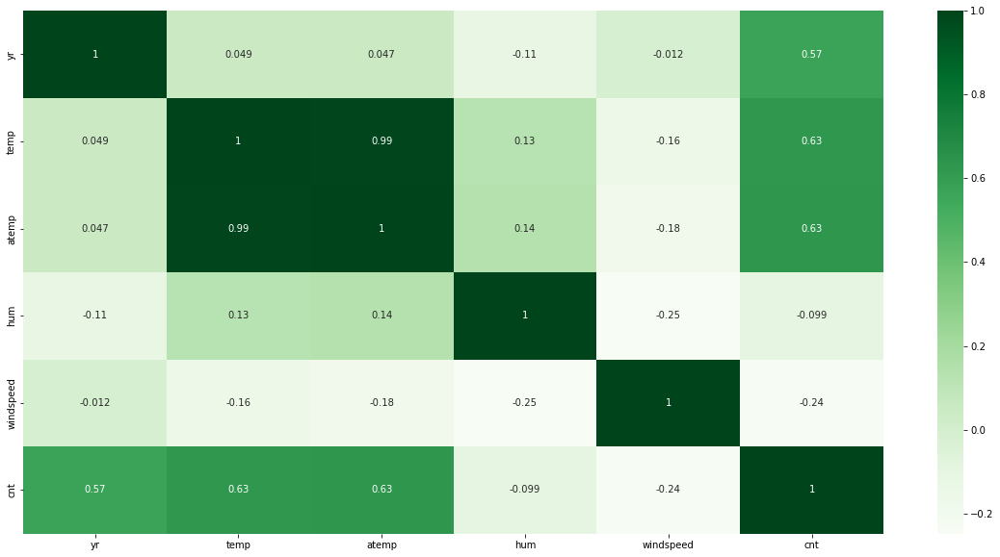

In [31]:
## Last correlation check

plt.figure(figsize=(20,10))
sns.heatmap(bike.corr(), annot=True , cmap = "Greens")

In [32]:
bike

,season,yr,mnth,weekday,workingday,weathersit,temp,atemp,hum,windspeed,cnt
0,spring,2018,Jan,Tue,Working,Mist,14.110847,18.18125,80.5833,10.749882,985
1,spring,2018,Jan,Wed,Working,Mist,14.902598,17.68695,69.6087,16.652113,801
2,spring,2018,Jan,Thu,Working,Clear,8.050924,9.47025,43.7273,16.636703,1349
3,spring,2018,Jan,Fri,Working,Clear,8.200000,10.60610,59.0435,10.739832,1562
4,spring,2018,Jan,Sat,Working,Clear,9.305237,11.46350,43.6957,12.522300,1600
...,...,...,...,...,...,...,...,...,...,...,...
725,spring,2019,Dec,Sat,Working,Mist,10.420847,11.33210,65.2917,23.458911,2114
726,spring,2019,Dec,Sun,Holiday,Mist,10.386653,12.75230,59.0000,10.416557,3095
727,spring,2019,Dec,Mon,Holiday,Mist,10.386653,12.12000,75.2917,8.333661,1341
728,spring,2019,Dec,Tue,Working,Clear,10.489153,11.58500,48.3333,23.500518,1796


### Bivariat analyses

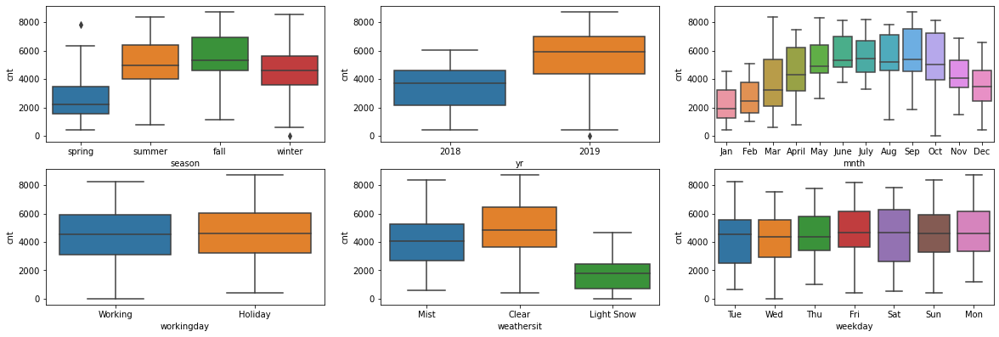

In [33]:
plt.figure(figsize=(20, 10))
plt.subplot(3,3,1)
sns.boxplot(x = 'season', y = 'cnt', data = bike)#yr','mnth','workingday','weathersit','weekday'
plt.subplot(3,3,2)
sns.boxplot(x = 'yr', y = 'cnt', data = bike)
plt.subplot(3,3,3)
sns.boxplot(x = 'mnth', y = 'cnt', data = bike)
plt.subplot(3,3,4)
sns.boxplot(x = 'workingday', y = 'cnt', data = bike)
plt.subplot(3,3,5)
sns.boxplot(x = 'weathersit', y = 'cnt', data = bike)
plt.subplot(3,3,6)
sns.boxplot(x = 'weekday', y = 'cnt', data = bike)
plt.show()

## Deal with Categorical Variables

#### Change categorical into dummies

In [34]:
seasons = pd.get_dummies(bike['season'], drop_first=True)
seasons

,spring,summer,winter
0,1,0,0
1,1,0,0
2,1,0,0
3,1,0,0
4,1,0,0
...,...,...,...
725,1,0,0
726,1,0,0
727,1,0,0
728,1,0,0


In [35]:
weekday = pd.get_dummies(bike['weekday'], drop_first=True)
weekday

,Mon,Sat,Sun,Thu,Tue,Wed
0,0,0,0,0,1,0
1,0,0,0,0,0,1
2,0,0,0,1,0,0
3,0,0,0,0,0,0
4,0,1,0,0,0,0
...,...,...,...,...,...,...
725,0,1,0,0,0,0
726,0,0,1,0,0,0
727,1,0,0,0,0,0
728,0,0,0,0,1,0


In [36]:
workingday=pd.get_dummies(bike['workingday'], drop_first=True)
workingday

,Working
0,1
1,1
2,1
3,1
4,1
...,...
725,1
726,0
727,0
728,1


In [37]:
month = pd.get_dummies(bike['mnth'], drop_first=True)
month

,Aug,Dec,Feb,Jan,July,June,Mar,May,Nov,Oct,Sep
0,0,0,0,1,0,0,0,0,0,0,0
1,0,0,0,1,0,0,0,0,0,0,0
2,0,0,0,1,0,0,0,0,0,0,0
3,0,0,0,1,0,0,0,0,0,0,0
4,0,0,0,1,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...
725,0,1,0,0,0,0,0,0,0,0,0
726,0,1,0,0,0,0,0,0,0,0,0
727,0,1,0,0,0,0,0,0,0,0,0
728,0,1,0,0,0,0,0,0,0,0,0


In [38]:
weathersit =  pd.get_dummies(bike['weathersit'], drop_first=True)
weathersit

,Light Snow,Mist
0,0,1
1,0,1
2,0,0
3,0,0
4,0,0
...,...,...
725,0,1
726,0,1
727,0,1
728,0,0


In [39]:
bike['yr'] = bike['yr'].map({2018 : 0 , 2019:1})

Concat dummie columns with data frame


In [40]:
bike1= pd.concat([bike,seasons,weathersit,workingday,weekday,month],axis=1)
bike1


,season,yr,mnth,weekday,workingday,weathersit,temp,atemp,hum,windspeed,...,Dec,Feb,Jan,July,June,Mar,May,Nov,Oct,Sep
0,spring,0,Jan,Tue,Working,Mist,14.110847,18.18125,80.5833,10.749882,...,0,0,1,0,0,0,0,0,0,0
1,spring,0,Jan,Wed,Working,Mist,14.902598,17.68695,69.6087,16.652113,...,0,0,1,0,0,0,0,0,0,0
2,spring,0,Jan,Thu,Working,Clear,8.050924,9.47025,43.7273,16.636703,...,0,0,1,0,0,0,0,0,0,0
3,spring,0,Jan,Fri,Working,Clear,8.200000,10.60610,59.0435,10.739832,...,0,0,1,0,0,0,0,0,0,0
4,spring,0,Jan,Sat,Working,Clear,9.305237,11.46350,43.6957,12.522300,...,0,0,1,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
725,spring,1,Dec,Sat,Working,Mist,10.420847,11.33210,65.2917,23.458911,...,1,0,0,0,0,0,0,0,0,0
726,spring,1,Dec,Sun,Holiday,Mist,10.386653,12.75230,59.0000,10.416557,...,1,0,0,0,0,0,0,0,0,0
727,spring,1,Dec,Mon,Holiday,Mist,10.386653,12.12000,75.2917,8.333661,...,1,0,0,0,0,0,0,0,0,0
728,spring,1,Dec,Tue,Working,Clear,10.489153,11.58500,48.3333,23.500518,...,1,0,0,0,0,0,0,0,0,0


In [41]:
cat_var

['season', 'mnth', 'weekday', 'workingday', 'weathersit']

In [42]:
bike1.drop(cat_var, axis=1, inplace=True)

In [43]:
bike1

,yr,temp,atemp,hum,windspeed,cnt,spring,summer,winter,Light Snow,...,Dec,Feb,Jan,July,June,Mar,May,Nov,Oct,Sep
0,0,14.110847,18.18125,80.5833,10.749882,985,1,0,0,0,...,0,0,1,0,0,0,0,0,0,0
1,0,14.902598,17.68695,69.6087,16.652113,801,1,0,0,0,...,0,0,1,0,0,0,0,0,0,0
2,0,8.050924,9.47025,43.7273,16.636703,1349,1,0,0,0,...,0,0,1,0,0,0,0,0,0,0
3,0,8.200000,10.60610,59.0435,10.739832,1562,1,0,0,0,...,0,0,1,0,0,0,0,0,0,0
4,0,9.305237,11.46350,43.6957,12.522300,1600,1,0,0,0,...,0,0,1,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
725,1,10.420847,11.33210,65.2917,23.458911,2114,1,0,0,0,...,1,0,0,0,0,0,0,0,0,0
726,1,10.386653,12.75230,59.0000,10.416557,3095,1,0,0,0,...,1,0,0,0,0,0,0,0,0,0
727,1,10.386653,12.12000,75.2917,8.333661,1341,1,0,0,0,...,1,0,0,0,0,0,0,0,0,0
728,1,10.489153,11.58500,48.3333,23.500518,1796,1,0,0,0,...,1,0,0,0,0,0,0,0,0,0


In [44]:
bike1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 730 entries, 0 to 729
Data columns (total 29 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   yr          730 non-null    int64  
 1   temp        730 non-null    float64
 2   atemp       730 non-null    float64
 3   hum         730 non-null    float64
 4   windspeed   730 non-null    float64
 5   cnt         730 non-null    int64  
 6   spring      730 non-null    uint8  
 7   summer      730 non-null    uint8  
 8   winter      730 non-null    uint8  
 9   Light Snow  730 non-null    uint8  
 10  Mist        730 non-null    uint8  
 11  Working     730 non-null    uint8  
 12  Mon         730 non-null    uint8  
 13  Sat         730 non-null    uint8  
 14  Sun         730 non-null    uint8  
 15  Thu         730 non-null    uint8  
 16  Tue         730 non-null    uint8  
 17  Wed         730 non-null    uint8  
 18  Aug         730 non-null    uint8  
 19  Dec         730 non-null    u

## Spilt Data into X and Y

In [45]:
X= bike1.drop('cnt',axis=1)
y = bike1['cnt']

### Split into Train and Test

In [46]:
X_train,X_test,y_train,y_test = train_test_split(X,y, test_size = 0.25, random_state = 100)

In [47]:
print('shape of X=', X_train.shape)
print('shape of Y = ' ,y_train.shape)
print('shape of X=', X_test.shape)
print('shape of Y = ' ,y_test.shape)

shape of X= (547, 28)
shape of Y =  (547,)
shape of X= (183, 28)
shape of Y =  (183,)


## Standard scaler

Standard scaler = sum(x - mean)/ standard deviation

sr = StandardScaler()

In [48]:
sr = StandardScaler()

In [49]:
X_train

,yr,temp,atemp,hum,windspeed,spring,summer,winter,Light Snow,Mist,...,Dec,Feb,Jan,July,June,Mar,May,Nov,Oct,Sep
311,0,16.741653,20.61230,72.1667,4.625513,0,0,1,0,0,...,0,0,0,0,0,0,0,1,0,0
523,1,26.615847,29.89310,46.7917,11.750661,0,1,0,0,0,...,0,0,0,0,1,0,0,0,0,0
381,1,15.294763,18.21390,71.6087,23.391710,1,0,0,0,1,...,0,0,1,0,0,0,0,0,0,0
413,1,14.213347,17.77125,53.4583,12.792243,1,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
253,0,26.786653,30.46145,71.3750,7.708618,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
578,1,30.852500,35.35440,65.9583,8.666718,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
53,0,9.091299,12.28585,42.3043,6.305571,1,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
350,0,10.591653,12.46855,56.0833,16.292189,0,0,1,0,1,...,1,0,0,0,0,0,0,0,0,0
79,0,17.647835,20.48675,73.7391,19.348461,0,1,0,0,1,...,0,0,0,0,0,1,0,0,0,0


In [50]:
var = ['temp',	'atemp',	'hum',	'windspeed'	]

In [51]:
X_train[var] = sr.fit_transform(X_train[var])

In [52]:
X_train.describe()

,yr,temp,atemp,hum,windspeed,spring,summer,winter,Light Snow,Mist,...,Dec,Feb,Jan,July,June,Mar,May,Nov,Oct,Sep
count,547.000000,5.470000e+02,5.470000e+02,5.470000e+02,5.470000e+02,547.000000,547.000000,547.000000,547.000000,547.000000,...,547.000000,547.000000,547.00000,547.000000,547.000000,547.000000,547.000000,547.000000,547.000000,547.000000
mean,0.508227,-4.150651e-16,-2.861818e-16,1.043244e-16,-3.599599e-16,0.257770,0.244973,0.244973,0.027422,0.349177,...,0.087751,0.073126,0.08958,0.071298,0.078611,0.096892,0.084095,0.082267,0.087751,0.080439
std,0.500390,1.000915e+00,1.000915e+00,1.000915e+00,1.000915e+00,0.437807,0.430465,0.430465,0.163460,0.477146,...,0.283192,0.260582,0.28584,0.257557,0.269376,0.296082,0.277784,0.275022,0.283192,0.272220
min,0.000000,-2.377654e+00,-2.416887e+00,-4.506596e+00,-1.888510e+00,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,-8.814836e-01,-8.748472e-01,-7.744398e-01,-7.184195e-01,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,1.000000,1.346465e-03,4.944221e-02,3.146721e-02,-1.491325e-01,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,1.000000,8.864806e-01,8.367699e-01,7.095042e-01,5.585633e-01,1.000000,0.000000,0.000000,0.000000,1.000000,...,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,1.000000,2.062049e+00,2.309129e+00,2.419458e+00,4.025702e+00,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.00000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [53]:
X_train

,yr,temp,atemp,hum,windspeed,spring,summer,winter,Light Snow,Mist,...,Dec,Feb,Jan,July,June,Mar,May,Nov,Oct,Sep
311,0,-0.445834,-0.350016,0.644081,-1.548612,0,0,1,0,0,...,0,0,0,0,0,0,0,1,0,0
523,1,0.886481,0.801459,-1.166982,-0.196494,0,1,0,0,0,...,0,0,0,0,1,0,0,0,0,0
381,1,-0.641062,-0.647587,0.604256,2.012594,1,0,0,0,1,...,0,0,1,0,0,0,0,0,0,0
413,1,-0.786976,-0.702507,-0.691174,0.001164,1,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
253,0,0.909527,0.871975,0.587576,-0.963540,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
578,1,1.458128,1.479047,0.200976,-0.781725,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
53,0,-1.478089,-1.383084,-1.487256,-1.229792,1,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
350,0,-1.275648,-1.360416,-0.503822,0.665339,0,0,1,0,1,...,1,0,0,0,0,0,0,0,0,0
79,0,-0.323564,-0.365593,0.756306,1.245319,0,1,0,0,1,...,0,0,0,0,0,1,0,0,0,0


## Stats Model

In [54]:
X_train_rfe = X_train
X_train_rfe = sm.add_constant(X_train_rfe)

In [55]:
stats_lr = sm.OLS(y_train,X_train_rfe).fit()
print(stats_lr.summary())

                            OLS Regression Results                            
Dep. Variable:                    cnt   R-squared:                       0.852
Model:                            OLS   Adj. R-squared:                  0.844
Method:                 Least Squares   F-statistic:                     106.7
Date:                Mon, 05 Dec 2022   Prob (F-statistic):          5.67e-195
Time:                        20:00:54   Log-Likelihood:                -4398.2
No. Observations:                 547   AIC:                             8854.
Df Residuals:                     518   BIC:                             8979.
Df Model:                          28                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       2755.8381    355.926      7.743      0.0

### Observation - 
1.As Atemp P value is high lets drop it

In [56]:
X_train_stats = X_train.copy()
X_train_stats.drop('atemp',axis=1,inplace = True)

In [57]:
X_train_rfe = X_train_stats
X_train_rfe = sm.add_constant(X_train_rfe)
stats_lr = sm.OLS(y_train,X_train_rfe).fit()
print(stats_lr.summary())

                            OLS Regression Results                            
Dep. Variable:                    cnt   R-squared:                       0.852
Model:                            OLS   Adj. R-squared:                  0.844
Method:                 Least Squares   F-statistic:                     110.8
Date:                Mon, 05 Dec 2022   Prob (F-statistic):          5.77e-196
Time:                        20:00:54   Log-Likelihood:                -4398.2
No. Observations:                 547   AIC:                             8852.
Df Residuals:                     519   BIC:                             8973.
Df Model:                          27                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       2753.6916    355.598      7.744      0.0

In [58]:
X_train_stats.shape

(547, 27)

## RFE

In [59]:
lr = LinearRegression()
lr.fit(X_train,y_train)

rfe = RFE(lr)
rfe = rfe.fit(X_train, y_train)

In [60]:
list(zip(X_train.columns,rfe.support_,rfe.ranking_))

[('yr', True, 1),
 ('temp', True, 1),
 ('atemp', False, 11),
 ('hum', False, 7),
 ('windspeed', False, 4),
 ('spring', True, 1),
 ('summer', False, 3),
 ('winter', True, 1),
 ('Light Snow', True, 1),
 ('Mist', True, 1),
 ('Working', True, 1),
 ('Mon', True, 1),
 ('Sat', False, 15),
 ('Sun', True, 1),
 ('Thu', False, 12),
 ('Tue', False, 6),
 ('Wed', False, 5),
 ('Aug', False, 8),
 ('Dec', True, 1),
 ('Feb', False, 2),
 ('Jan', True, 1),
 ('July', True, 1),
 ('June', False, 10),
 ('Mar', False, 14),
 ('May', False, 9),
 ('Nov', True, 1),
 ('Oct', False, 13),
 ('Sep', True, 1)]

In [61]:
col = X_train.columns[rfe.support_]
col

Index(['yr', 'temp', 'spring', 'winter', 'Light Snow', 'Mist', 'Working',
       'Mon', 'Sun', 'Dec', 'Jan', 'July', 'Nov', 'Sep'],
      dtype='object')

In [62]:
X_train_rfe = X_train[col]
X_train_rfe = sm.add_constant(X_train_rfe)
lm = sm.OLS(y_train,X_train_rfe).fit() 
lm.summary()


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    cnt   R-squared:                       0.830
Model:                            OLS   Adj. R-squared:                  0.826
Method:                 Least Squares   F-statistic:                     185.9
Date:                Mon, 05 Dec 2022   Prob (F-statistic):          2.13e-194
Time:                        20:00:54   Log-Likelihood:                -4436.0
No. Observations:                 547   AIC:                             8902.
Df Residuals:                     532   BIC:                             8967.
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       3043.7890    245.449     12.401      0.000    2561.621    3525.956
yr          2027.6483     70.423     28.792      0.000    1889.307    2165.990
temp         851.6357     62.832     13.554      0.000     728.207     975.065
spring      -974.5296    133.987     -7.273      0.000   -1237.737    -711.322
winter       699.8257    119.865      5.838      0.000     464.359     935.293
Light Snow -2694.3508    218.936    -12.307      0.000   -3124.435   -2264.266
Mist        -690.4304     74.922     -9.215      0.000    -837.610    -543.251
Working      871.1784    232.978      3.739      0.000     413.508    1328.849
Mon         1050.0495    248.546      4.225      0.000     561.797    1538.302
Sun         1039.4919    249.743      4.162      0.000     548.889    1530.095
Dec         -415.3967    146.355     -2.838      0.005    -702.902    -127.892
Jan         -325.2870    152.964     -2.127      0.034    -625.775     -24.799
July        -562.8466    153.547     -3.666      0.000    -864.480    -261.214
Nov         -509.9029    163.344     -3.122      0.002    -830.781    -189.025
Sep          494.4155    135.144      3.658      0.000     228.935     759.896
==============================================================================
Omnibus:                       90.262   Durbin-Watson:                   1.990
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              246.927
Skew:                          -0.813   Prob(JB):                     2.40e-54
Kurtosis:                       5.862   Cond. No.                         19.9
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

### VIF 

In [63]:
vif = pd.DataFrame()
X =X_train_rfe
vif['feature']= X.columns
vif['VIF'] =  [variance_inflation_factor(X_train_rfe.values,i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] =  round(vif['VIF'],2)
vif = vif.sort_values(by = 'VIF', ascending= False)
vif

,feature,VIF
0,const,49.47
7,Working,9.02
8,Mon,5.87
9,Sun,5.58
2,temp,3.24
3,spring,2.82
4,winter,2.18
13,Nov,1.65
11,Jan,1.57
10,Dec,1.41


### Linear Regression Residual

In [64]:
X_train_stats

,yr,temp,hum,windspeed,spring,summer,winter,Light Snow,Mist,Working,...,Dec,Feb,Jan,July,June,Mar,May,Nov,Oct,Sep
311,0,-0.445834,0.644081,-1.548612,0,0,1,0,0,1,...,0,0,0,0,0,0,0,1,0,0
523,1,0.886481,-1.166982,-0.196494,0,1,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
381,1,-0.641062,0.604256,2.012594,1,0,0,0,1,1,...,0,0,1,0,0,0,0,0,0,0
413,1,-0.786976,-0.691174,0.001164,1,0,0,0,0,1,...,0,1,0,0,0,0,0,0,0,0
253,0,0.909527,0.587576,-0.963540,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
578,1,1.458128,0.200976,-0.781725,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
53,0,-1.478089,-1.487256,-1.229792,1,0,0,0,0,1,...,0,1,0,0,0,0,0,0,0,0
350,0,-1.275648,-0.503822,0.665339,0,0,1,0,1,1,...,1,0,0,0,0,0,0,0,0,0
79,0,-0.323564,0.756306,1.245319,0,1,0,0,1,1,...,0,0,0,0,0,1,0,0,0,0


In [65]:
lr  = LinearRegression()

In [66]:
var

['temp', 'atemp', 'hum', 'windspeed']

In [67]:
X_test[var] = sr.transform(X_test[var])

In [68]:
lm = LinearRegression()
lm.fit(X_train_stats,y_train)

LinearRegression()

In [69]:
col = X_train_stats.columns

In [70]:
X_test = X_test[col]

In [71]:
y_pred = lm.predict(X_test)
y_pred

array([ 3413.54753468,  7825.80426805,  3828.39326358,  5374.67004694,
        5300.89158575,  3921.08584533,  4373.39064993,  3995.65079881,
        6078.65165424,  4813.79709927,  7098.98692608,  5995.93364953,
        4336.21442236,  6201.36725249,  1267.96831421,  6977.52540329,
        5280.36095461,  1410.66238232,  5300.80363172,  5218.83436997,
        7282.17251948,  5428.46904395,  7035.76460198,  1193.49533155,
        3586.78958861,  4582.65706822,  7316.07707982,  4525.23211683,
        7441.66555394,  4249.20999653,  6929.67177828,  6456.75173679,
        4369.56048131,  5537.52943977,  1409.43545214,  4287.92610862,
        4577.89239232,  6187.34179692,  1111.79902687,  3899.99781964,
        4248.36375534,  3015.32666221,  5712.08844261,  5181.19800459,
        5628.10696258,  7100.12003415,  1862.58292617,  5480.41756798,
        4978.45081747,  2398.04623694,  6949.46208118,  4100.81894177,
        4844.98534307,  7345.2257572 ,  3219.20505868,  7173.26119736,
      

In [72]:
r2_score(y_test,y_pred)

0.8133863048572154

## Residual Analysis

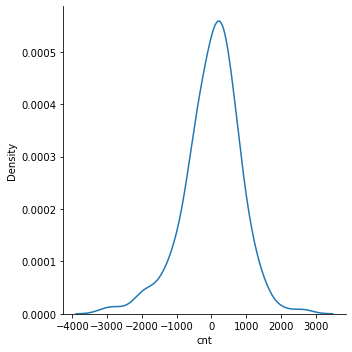

In [73]:
sns.displot((y_test - y_pred), kind="kde")


## Observation - 
With Stats model with droping much columns I am getting R2 score value around 81 percent

## Build Linear Model After the RFE select

In [74]:
X_train_rfe

,const,yr,temp,spring,winter,Light Snow,Mist,Working,Mon,Sun,Dec,Jan,July,Nov,Sep
311,1.0,0,-0.445834,0,1,0,0,1,0,0,0,0,0,1,0
523,1.0,1,0.886481,0,0,0,0,0,0,1,0,0,0,0,0
381,1.0,1,-0.641062,1,0,0,1,1,0,0,0,1,0,0,0
413,1.0,1,-0.786976,1,0,0,0,1,0,0,0,0,0,0,0
253,1.0,0,0.909527,0,0,0,0,1,0,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
578,1.0,1,1.458128,0,0,0,0,1,0,0,0,0,0,0,0
53,1.0,0,-1.478089,1,0,0,0,1,0,0,0,0,0,0,0
350,1.0,0,-1.275648,0,1,0,1,1,0,0,1,0,0,0,0
79,1.0,0,-0.323564,0,0,0,1,1,0,0,0,0,0,0,0


In [75]:
X_train_rfe = X_train_rfe.drop(['const','Working'], axis=1)

In [76]:
col = X_train_rfe.columns

In [77]:
X_test = X_test[col]

In [78]:
lr = LinearRegression()
lr.fit(X_train_rfe,y_train)

LinearRegression()

In [79]:
y_pred = lr.predict(X_test)

In [80]:
r2_score(y_test,y_pred)

0.8173597022467133

In [81]:
def adj_r2(x,y):
    r2 = r2_score(x,y)
    n= x.shape[0]
    p = len(x.shape)
    adjusted_r2 = 1-(1-r2)*(n-1)/(n-p-1)
    return adjusted_r2

In [82]:
col

Index(['yr', 'temp', 'spring', 'winter', 'Light Snow', 'Mist', 'Mon', 'Sun',
       'Dec', 'Jan', 'July', 'Nov', 'Sep'],
      dtype='object')

## Error Term

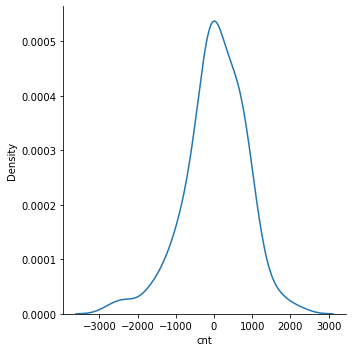

In [83]:
sns.displot((y_test - y_pred), kind="kde")


In [84]:
lr.coef_

array([ 2018.6304395 ,   845.05656994, -1009.87660279,   705.98737798,
       -2679.74675187,  -686.2385299 ,   206.6982868 ,   196.06896264,
        -448.11750774,  -350.15553364,  -551.38050751,  -555.53231987,
         458.86227788])

In [85]:
lr.intercept_

3908.31488434041

In [86]:
adj_r2(y_test,y_pred)

0.8163506398281868

<AxesSubplot:xlabel='cnt'>

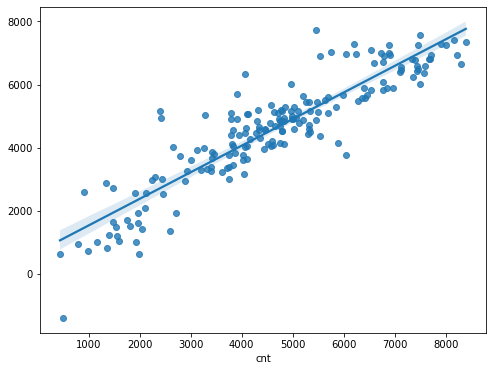

In [87]:
plt.figure(figsize=(8,6))
sns.regplot(y_test,y_pred)

In [88]:
lr.score(X_test,y_test)

0.8173597022467133

In [89]:
X_test.columns

Index(['yr', 'temp', 'spring', 'winter', 'Light Snow', 'Mist', 'Mon', 'Sun',
       'Dec', 'Jan', 'July', 'Nov', 'Sep'],
      dtype='object')

## Equation - 

018.6304395 * yr ,   845.05656994 * temp, -1009.87660279*spring,   705.98737798*winter,
       -2679.74675187* Light snow,  -686.2385299 * Mist ,   206.6982868 * Mon,   196.06896264 * Sun,
        -448.11750774 * Dec,  -350.15553364 *Jan,  -551.38050751* July,  -555.53231987 * Nov,
         458.86227788 * Sep x 3908.31488434041])